In [72]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

import xgboost as xgb
import lightgbm as lgbm

from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix

import lime
import lime.lime_tabular

import warnings
from lime import submodular_pick

from sklearn.preprocessing import PolynomialFeatures

## Data preparation

In [73]:
df = pd.read_csv('data/Bank Customer Churn Prediction.csv')
df.head()

,customer_id,credit_score,country,gender,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,churn
0,15634602,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,15647311,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,15619304,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,15701354,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,15737888,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [74]:
X = df.drop(columns=['churn', 'customer_id', 'active_member'])
y = df['churn']

In [75]:
y.value_counts()

0    7963
1    2037
Name: churn, dtype: int64

In [76]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=111, shuffle=True, stratify=y)

In [77]:
y_train.value_counts()

0    5335
1    1365
Name: churn, dtype: int64

In [78]:
y_test.value_counts()

0    2628
1     672
Name: churn, dtype: int64

In [79]:
enc = OneHotEncoder(handle_unknown='ignore', drop='if_binary')
X_train_oh = enc.fit_transform(X_train[['country', 'gender']])
X_test_oh = enc.transform(X_test[['country', 'gender']])

column_name = enc.get_feature_names_out(['country', 'gender'])
X_train_oh = pd.DataFrame(X_train_oh.toarray(), columns=column_name, index=X_train.index)
X_test_oh = pd.DataFrame(X_test_oh.toarray(), columns=column_name, index=X_test.index)

X_train_num =  pd.concat([X_train.drop(columns=['country', 'gender']), X_train_oh], axis=1)
X_test_num =  pd.concat([X_test.drop(columns=['country', 'gender']), X_test_oh], axis=1)

In [80]:
X_train_2, X_val, y_train_2, y_val = train_test_split(X_train_num, y_train, test_size=0.33, random_state=111, shuffle=True, stratify=y_train)

## Train

### XGBoost

In [81]:
params = {
    'objective': 'binary:logistic',  # Binary classification
    'max_depth': 5,                  # Maximum depth of a tree
    'eta': 0.1,                      # Learning rate
    'subsample': 0.9,                # Subsample ratio of the training instances
    'colsample_bytree': 0.9,         # Subsample ratio of columns when constructing each tree
    'eval_metric': 'auc',            # Evaluation metric
    'scale_pos_weight': 3, 
    'tree_method': 'hist',
    'alpha': 0.1, 
    'gamma': 0.1, 
}

xgb_train = xgb.XGBClassifier(**params)
xgb_train.fit(X_train_2, y_train_2, early_stopping_rounds=20, eval_set=[(X_val, y_val)], verbose=10)

dump_list = xgb_train.get_booster().get_dump()
num_trees = len(dump_list)

clf_xgb = xgb.XGBClassifier(**params, n_estimators=num_trees)
clf_xgb.fit(X_train_num, y_train)

y_pred_dt = clf_xgb.predict(X_test_num)

[0]	validation_0-auc:0.83679
[10]	validation_0-auc:0.86170
[20]	validation_0-auc:0.86006
[25]	validation_0-auc:0.86049


/home/marek/anaconda3/envs/tibia/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


In [82]:
print(classification_report(y_test, y_pred_dt))

              precision    recall  f1-score   support

           0       0.91      0.84      0.87      2628
           1       0.51      0.68      0.59       672

    accuracy                           0.80      3300
   macro avg       0.71      0.76      0.73      3300
weighted avg       0.83      0.80      0.81      3300



In [83]:
confusion_matrix(y_test, y_pred_dt)

array([[2197,  431],
       [ 215,  457]])

### Importances

Get feature importance of each feature. For tree model Importance type can be defined as:
- ‘weight’: the number of times a feature is used to split the data across all trees.
- ‘gain’: the average gain across all splits the feature is used in.
- ‘cover’: the average coverage across all splits the feature is used in.
- ‘total_gain’: the total gain across all splits the feature is used in.
- ‘total_cover’: the total coverage across all splits the feature is used in.

In [84]:
df_imp_gain = pd.DataFrame.from_dict([
    clf_xgb.get_booster().get_score(importance_type='gain'),
]).T.reset_index()

df_imp_gain.columns = ['feature_name', 'feature_importance']

df_imp_gain.sort_values('feature_importance', ascending=False)

,feature_name,feature_importance
4,products_number,95.252045
1,age,62.754169
8,country_Germany,31.896646
3,balance,20.991777
7,country_France,15.002167
9,country_Spain,14.187317
10,gender_Male,13.190211
2,tenure,7.039418
0,credit_score,7.027490
6,estimated_salary,6.032663


In [85]:
df_imp_weight = pd.DataFrame.from_dict([
    clf_xgb.get_booster().get_score(importance_type='weight'),
]).T.reset_index()

df_imp_weight.columns = ['feature_name', 'feature_importance']

df_imp_weight.sort_values('feature_importance', ascending=False)

,feature_name,feature_importance
1,age,153.0
3,balance,140.0
6,estimated_salary,77.0
4,products_number,75.0
0,credit_score,72.0
10,gender_Male,42.0
2,tenure,33.0
8,country_Germany,33.0
7,country_France,13.0
9,country_Spain,10.0


## Select examples to examine later

In [86]:
# Get predicted probabilities for all examples in the test set
all_predicted_probabilities = clf_xgb.predict_proba(X_test_num)

# Get predicted classes for all examples in the test set
all_predictions = clf_xgb.predict(X_test_num)

y_test_all = pd.DataFrame(y_test).reset_index()
y_test_all['pred'] = all_predictions
y_test_all['proba'] = all_predicted_probabilities[:,1]

correct_1_max = y_test_all[
    (y_test_all['churn']==y_test_all['pred'])
    & (y_test_all['churn']==1)
]['proba'].idxmax()

correct_1_min = y_test_all[
    (y_test_all['churn']==y_test_all['pred'])
    & (y_test_all['churn']==1)
]['proba'].idxmin()

correct_0_max = y_test_all[
    (y_test_all['churn']==y_test_all['pred'])
    & (y_test_all['churn']==0)
]['proba'].idxmax()

correct_0_min = y_test_all[
    (y_test_all['churn']==y_test_all['pred'])
    & (y_test_all['churn']==0)
]['proba'].idxmin()

incorrect_0_max = y_test_all[
    (y_test_all['churn']!=y_test_all['pred'])
    & (y_test_all['churn']==0)
]['proba'].idxmax()

incorrect_1_min = y_test_all[
    (y_test_all['churn']!=y_test_all['pred'])
    & (y_test_all['churn']==1)
]['proba'].idxmin()

selected_examples = [
    correct_1_max,
    correct_1_min,
    incorrect_1_min,
    correct_0_max,
    correct_0_min,
    incorrect_0_max
]

## Build in XGB conributions for each instance

In [87]:
# # Convert the instance to DMatrix format
# i = selected_examples[0]
# instance_dmatrix = xgb.DMatrix(X_test_num.iloc[i].values.reshape(-1,1))

# # Get the prediction margin (raw output before transformation)
# margin = clf_xgb.predict(X_test_num.iloc[i].values.reshape(1,-1), output_margin=True)

# # Get the prediction path
# pred_contribs = clf_xgb.get_booster().predict(xgb.DMatrix(X_test_num).slice([i]), pred_contribs=True)

# # Print the prediction path
# print("Prediction contributions for the instance:")
# for i, (f, contrib) in enumerate(zip(X_test_num.columns, pred_contribs[0])):
#     print(f"{f:<20}: {contrib:>5.2f}")

## LIME explainer

In [88]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_num.values,
    feature_names=X_train_num.columns,
    class_names=['Class 0', 'Class 1'],
    mode='classification',
    random_state=111,
    discretize_continuous=True,
    kernel_width=1.5,
    sample_around_instance=True
)

### instance

In [89]:
# Choose an instance to explain
instance_idx = 0
instance = X_test_num.iloc[instance_idx]

print(y_test.iloc[instance_idx])

# Explain the instance
exp = explainer.explain_instance(
    instance.values,
    clf_xgb.predict_proba,
    num_features=5 #X_test_num.shape[1],
)

# Show the explanation
exp.show_in_notebook(show_table=True)

0


### heatmap of explenations

In [90]:
# Define the function to get explanations for each observation
def get_explanations(model, X, num_features, num_samples):
    explanations = []
    local_fits = []
    for i in range(X.shape[0]):
        exp = explainer.explain_instance(
            data_row=X.iloc[i].values,
            predict_fn=model.predict_proba,
            num_features=num_features,
            num_samples=num_samples,
        )
        exp_dict = dict(exp.as_list())
        explanations.append(exp_dict)
        local_fits.append(exp.score)  # Store the fit of the local surrogate model (R² score)
    return explanations, local_fits

In [91]:
# Get explanations for all observations
explanations, local_fits = get_explanations(clf_xgb, X_test_num.sample(110, random_state=111), num_features=7, num_samples=100)
# explanations = get_explanations(clf_xgb, X_test_num.sample(110), num_features=X_test_num.shape[1])

# Convert explanations to a DataFrame
exp_df = pd.DataFrame(explanations).fillna(0)

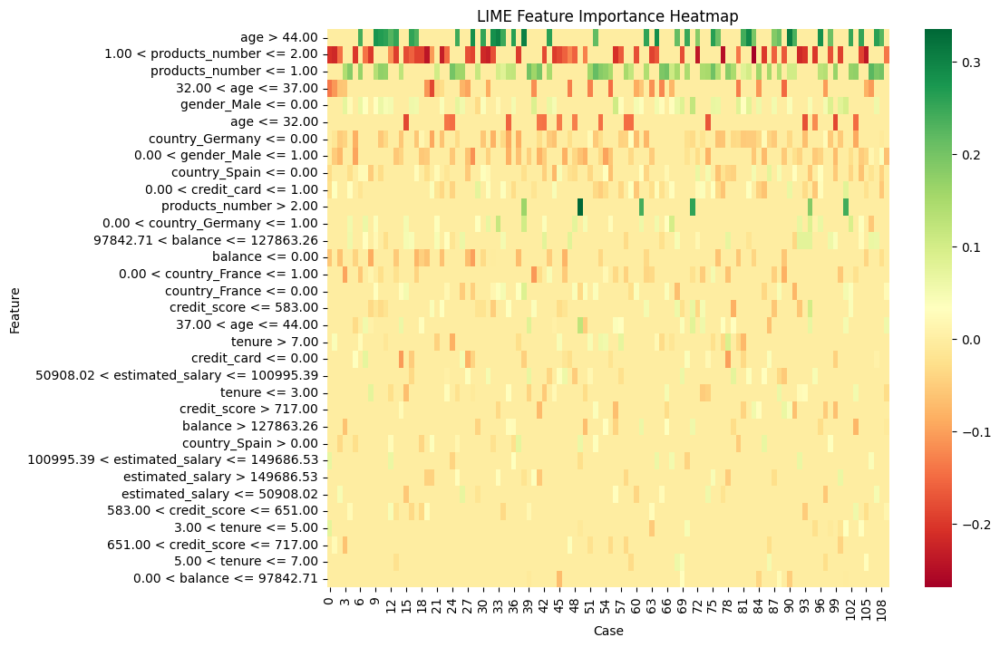

In [92]:
# Create a heatmap for feature importance
plt.figure(figsize=(10, 8))

# Calculate the mean of the absolute values for each column
mean_abs_values = exp_df.abs().mean()

# Sort columns by the mean of absolute values
sorted_columns = mean_abs_values.sort_values(ascending=False).index

# Reorder DataFrame columns
exp_df = exp_df[sorted_columns]

sns.heatmap(exp_df.T, cmap='RdYlGn', yticklabels=True)
plt.xlabel('Case')
plt.ylabel('Feature')
plt.title('LIME Feature Importance Heatmap')
plt.show()

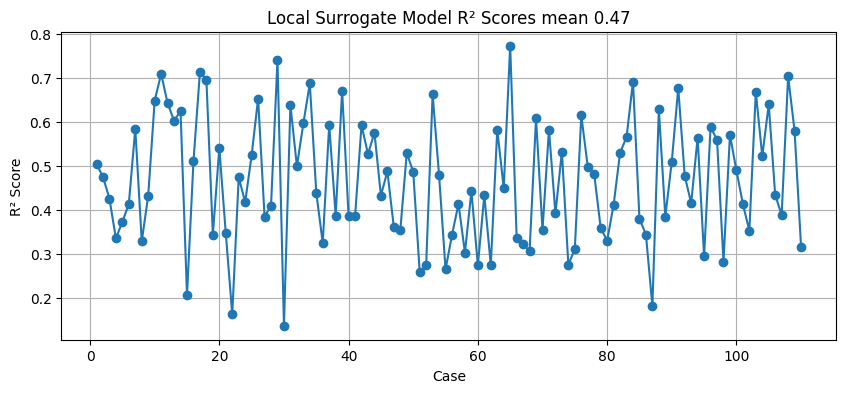

In [93]:
# Plot the R² scores
plt.figure(figsize=(10, 4))
plt.plot(range(1, len(local_fits) + 1), local_fits, marker='o')
plt.xlabel('Case')
plt.ylabel('R² Score')
plt.title(f'Local Surrogate Model R² Scores mean {np.mean(local_fits):.2f}')
plt.grid(True)
plt.show()

### SP-LIME (global)

In [94]:
# # Remember to convert the dataframe to matrix values
# # SP-LIME returns exaplanations on a sample set to provide a non redundant global decision boundary of original model
# sp_obj = submodular_pick.SubmodularPick(
#     explainer, 
#     X_test_num.values, 
#     clf_xgb.predict_proba, 
#     num_features=5,
#     num_exps_desired=3
# )

In [95]:
# [exp.show_in_notebook(show_table=True) for exp in sp_obj.sp_explanations]

## Examine few examples

In [96]:
for i in selected_examples:
    if y_test.iloc[i] == all_predictions[i]:
        print('CORRECT PREDICTION')
    else:
        print('INCORRECT PREDICTION')
        
    print(f'True value {y_test.iloc[i]}, predicted probab {all_predicted_probabilities[i,1]:.2f}')

    # Explain the instance
    exp = explainer.explain_instance(
        X_test_num.iloc[i].values,
        clf_xgb.predict_proba,
        num_features=5
    )

    # Show the explanation
    exp.show_in_notebook(show_table=True)

CORRECT PREDICTION
True value 1, predicted probab 0.95


CORRECT PREDICTION
True value 1, predicted probab 0.50


INCORRECT PREDICTION
True value 1, predicted probab 0.05


CORRECT PREDICTION
True value 0, predicted probab 0.50


CORRECT PREDICTION
True value 0, predicted probab 0.05


INCORRECT PREDICTION
True value 0, predicted probab 0.93


## Neighbourhoods visualisation

In [97]:
X_test_num_prob = X_test_num.copy() 
X_test_num_prob['proba'] = all_predicted_probabilities[:,1]

We can explore two neighborhoods in closer detail: one smaller (blue) and one larger (orange).

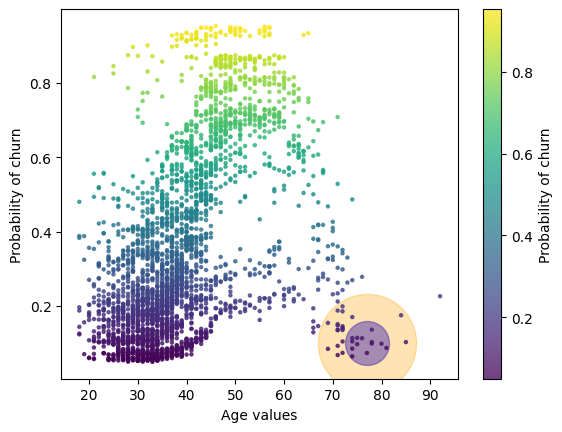

In [98]:
# plt.plot(X_test_num_prob['age'], X_test_num_prob['proba'], '.')
# plt.xlabel('Age values')
# plt.ylabel('Probability of churn')

plt.scatter([77], [0.1], c='blue', alpha=0.5, s=1000)
plt.scatter([77], [0.1], c='orange', alpha=0.3, s=5000)

plt.scatter(X_test_num_prob['age'], X_test_num_prob['proba'], 
            c=X_test_num_prob['proba'], alpha=0.75, s=5)
plt.xlabel('Age values')
plt.ylabel('Probability of churn')
plt.colorbar(label='Probability of churn')

plt.show()

In [99]:
# extract +- both neighborhoods 
X_nn_small = X_test_num_prob[
    (X_test_num_prob['age'] < 83) & (X_test_num_prob['age'] > 73) 
    & (X_test_num_prob['proba'] < 0.1)
]

X_nn_big = X_test_num_prob[
    (X_test_num_prob['age'] < 90) & (X_test_num_prob['age'] > 68) 
    & (X_test_num_prob['proba'] < 0.2)
]

print(X_nn_small.shape)
print(X_nn_big.shape)

(7, 12)
(33, 12)


In [100]:
# create funtion to fit the line to selected region
def fit_line_to_data(x, y):
    # Calculate mean of x and y
    x_mean = np.mean(x)
    y_mean = np.mean(y)
    
    # Calculate slope (m) and y-intercept (c) of the line
    numerator = np.sum((x - x_mean) * (y - y_mean))
    denominator = np.sum((x - x_mean) ** 2)
    slope = numerator / denominator
    intercept = y_mean - slope * x_mean
    
    return slope, intercept

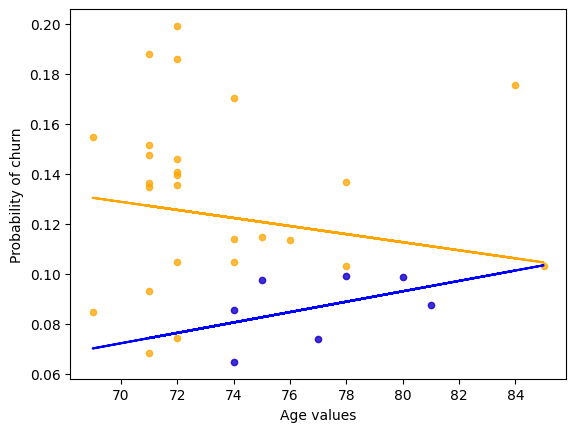

In [101]:
# blot both neighborhoods with fitted lines
plt.scatter(X_nn_big['age'], X_nn_big['proba'],alpha=0.75, s=20, c='orange')
plt.scatter(X_nn_small['age'], X_nn_small['proba'],alpha=0.75, s=20, c='blue')

plt.xlabel('Age values')
plt.ylabel('Probability of churn')

slope_small, intercept_small = fit_line_to_data(X_nn_small['age'].values, X_nn_small['proba'].values)
plt.plot(X_nn_big['age'].values, slope_small * X_nn_big['age'].values + intercept_small, color='blue', label='Best-Fitting Line')

slope_big, intercept_big = fit_line_to_data(X_nn_big['age'].values, X_nn_big['proba'].values)
plt.plot(X_nn_big['age'].values, slope_big * X_nn_big['age'].values + intercept_big, color='orange', label='Best-Fitting Line')

plt.show()

Now, putting it all together, we can observe that based on the neighborhood, we can easily discern the different influences (positive or negative) of age on predicted probability.

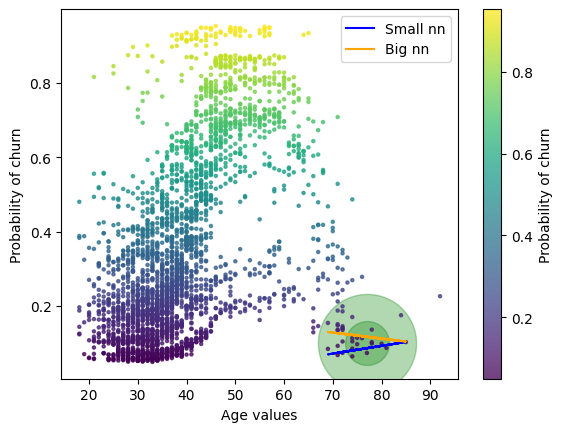

In [102]:
plt.scatter([77], [0.1], c='green', alpha=0.3, s=1000)
plt.scatter([77], [0.1], c='green', alpha=0.3, s=5000)

plt.scatter(X_test_num_prob['age'], X_test_num_prob['proba'], 
            c=X_test_num_prob['proba'], alpha=0.75, s=5)

plt.plot(X_nn_big['age'].values, slope_small * X_nn_big['age'].values + intercept_small, color='blue', label='Small nn')
plt.plot(X_nn_big['age'].values, slope_big * X_nn_big['age'].values + intercept_big, color='orange', label='Big nn')

plt.xlabel('Age values')
plt.ylabel('Probability of churn')
plt.colorbar(label='Probability of churn')

plt.legend()

plt.show()

### Wrong neighborhood

![title](images/wrong_n_cats.jpg)